## Data quality


### A regional Earth system data lab for understanding ecosystem dynamics: An example from tropical  South America
#### Paper submitted to Frontiers in Earth Science
##### Estupinan-Suarez, et al.,  correspondence to: lestup@bgc-jena.mpg.de

This scipts does the following:
- Calculates the number of missing values for each time step of the Mean Seasonal Cycle (MSC)
- Identifies pixels where at least all time steps have one value within the assessed period (2001-2014)
- Creates a mask from uncomplete MSC pixels of all assessed variables (GPP, NDVI, EVI, FPAR)


About the notebook
- It is written in Julia 1.5.
- "#" comments in the code are intended to explain specific aspects of the coding
- New steps in workflows are introduced with bold headers

March 2021, Max Planck Insitute of Biogeochemistry, Jena, Germany

## Load packages

In [1]:
using ESDL

In [2]:
using ESDLPlots

HTML{String}("<script>\n// Immediately-invoked-function-expression to avoid global variables.\n(function() {\n    var warning_div = document.getElementById(\"webio-warning-18379800117522764575\");\n    var hide = function () {\n        var script = document.getElementById(\"webio-setup-10770456172730637227\");\n        var parent = script && script.parentElement;\n        var grandparent = parent && parent.parentElement;\n        if (grandparent) {\n            grandparent.style.display = \"none\";\n        }\n        warning_div.style.display = \"none\";\n    };\n    if (typeof Jupyter !== \"undefined\") {\n        console.log(\"WebIO detected Jupyter notebook environment.\");\n        // Jupyter notebook.\n        var extensions = (\n            Jupyter\n            && Jupyter.notebook.config.data\n            && Jupyter.notebook.config.data.load_extensions\n        );\n        if (extensions && extensions[\"webio-jupyter-notebook\"]) {\n            // Extension already loaded.\n            console.log(\"Jupyter WebIO nbextension detected; not loading ad-hoc.\");\n            hide();\n            return;\n        }\n    } else if (window.location.pathname.includes(\"/lab\")) {\n        // Guessing JupyterLa\n        console.log(\"Jupyter Lab detected; make sure the @webio/jupyter-lab-provider labextension is installed.\");\n        hide();\n        return;\n    }\n})();\n\n</script>\n<p\n    id=\"webio-warning-18379800117522764575\"\n    class=\"output_text output_stderr\"\n    style=\"padding: 1em; font-weight: bold;\"\n>\n    Unable to load WebIO. Please make sure WebIO works for your Jupyter client.\n    For troubleshooting, please see <a href=\"https://juliagizmos.github.io/WebIO.jl/latest/providers/ijulia/\">\n    the WebIO/IJulia documentation</a>.\n    <!-- TODO: link to installation docs. -->\n</p>\n")

In [3]:
using Dates

In [4]:
using OnlineStats

In [5]:
using DelimitedFiles

In [6]:
using Distributed

## Set reading and output paths

In [44]:
pathin = "../mypath/"# => Set your path

"../mypath/"

In [45]:
pathout = "../mypath"# => Set your path

"../mypath"

## Load cube 

In [9]:
# High resolution
c = Cube(string(pathin,"/Cube_2020highColombiaCube_184x120x120.zarr/"))

YAXArray with the following dimensions
lon                 Axis with 2760 Elements from -82.99622135 to -60.00464665
lat                 Axis with 3360 Elements from 13.99613735 to -13.99541735
time                Axis with 782 Elements from 2001-01-05T00:00:00 to 2017-12-31T00:00:00
Variable            Axis with 5 elements: gross_primary_productivity ndvi lai evi fpar 
Total size: 135.08 GB


In [10]:
# Set assessed period based on variables temporal overlapping
c = c[time=2001:2014]

YAXArray with the following dimensions
lon                 Axis with 2760 Elements from -82.99622135 to -60.00464665
lat                 Axis with 3360 Elements from 13.99613735 to -13.99541735
time                Axis with 644 Elements from 2001-01-05T00:00:00 to 2014-12-31T00:00:00
Variable            Axis with 5 elements: gross_primary_productivity ndvi lai evi fpar 
Total size: 111.24 GB


In [11]:
# Set time for plotting
t = Date(2014, 1, 31)

2014-01-31

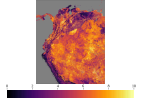

In [12]:
# Visualization of data subset
plotMAP(c, time=t, variable="gross_primary_productivity", dmin=0, dmax=10)

## Set missings

In [13]:
# Because NDVI and EVI have the same quality flags, we just calculate a general mask for both
# vegetation indices (vi). The missing value from MODIS vegetation indices is "65335.0"
cvi = map(x-> ismissing(x) ? missing : x==65335.0 ? missing : x, c[variable="ndvi"])

YAXArray with the following dimensions
lon                 Axis with 2760 Elements from -82.99622135 to -60.00464665
lat                 Axis with 3360 Elements from 13.99613735 to -13.99541735
time                Axis with 644 Elements from 2001-01-05T00:00:00 to 2014-12-31T00:00:00
Total size: 22.25 GB


In [14]:
# The missing value from fpar is "255.0"
cfpar = map(x-> ismissing(x) ? missing : x==255.0 ? missing : x, c[variable="fpar"])

YAXArray with the following dimensions
lon                 Axis with 2760 Elements from -82.99622135 to -60.00464665
lat                 Axis with 3360 Elements from 13.99613735 to -13.99541735
time                Axis with 644 Elements from 2001-01-05T00:00:00 to 2014-12-31T00:00:00
Total size: 22.25 GB


## Count missings per Mean Seasonal Cycle (MSC) time-steps

In [15]:
# Get the number of time steps per year
npy = getNpY(cvi)

46

In [16]:
# Define cube dimmensions for applying the MapCube function 

# Set input dimension
indims = InDims("time")

# Define "Day-of-year (DOY) as the new output dimension"
newaxis = RangeAxis("DOY",collect(1:npy))

# Set output dimension
outdims = OutDims(newaxis)

OutDims((YAXArrays.Cubes.Axes.ByValue(DOY                 Axis with 46 Elements from 1 to 46),), :auto, Base.Iterators.Pairs{Union{},Union{},Tuple{},NamedTuple{(),Tuple{}}}(), false, Array, :input, 1)

In [17]:
# @everywhere 
# This function calculates the number of missing values for each MSC time-step 
function doymisFx(xout, xin, idoy, doyin)# idoy, doyin, 
    #size(xout)
    for i in 1:length(idoy)
        idx = findall(x->x==idoy[i], doyin)
        xout[i] = sum(ismissing.(xin[idx]))        
    end
    return xout
end

doymisFx (generic function with 1 method)

In [18]:
# Extract the time axes from the cube
tax = collect(cvi.axes[3].values);

In [19]:
# Define the day-of-year for each date along the time axis 
doyin = map(x->Dates.dayofyear(x), tax);

In [20]:
# Find the unique day-of-year along the time axis and sort it
idoy = sort!(unique(doyin));

#### Calculate vegetation indices missings for MSC time-steps 

In [21]:
# addprocs(4)
# workers()
# rmprocs(workers())

In [22]:
# Map function to calculate missing values for each annual time step
cvimis = mapCube(doymisFx, cvi, idoy, doyin, indims=indims, outdims=outdims)

Progress: 100%|█████████████████████████████████████████| Time: 0:06:29


YAXArray with the following dimensions
DOY                 Axis with 46 Elements from 1 to 46
lon                 Axis with 2760 Elements from -82.99622135 to -60.00464665
lat                 Axis with 3360 Elements from 13.99613735 to -13.99541735
Total size: 1.59 GB


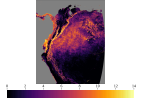

In [23]:
plotMAP(cvimis, DOY=23)

#### Calculate fpar missings for MSC time-steps

In [24]:
cfparmis = mapCube(doymisFx, cfpar, idoy, doyin, indims=indims, outdims=outdims)

Progress: 100%|█████████████████████████████████████████| Time: 0:06:33


YAXArray with the following dimensions
DOY                 Axis with 46 Elements from 1 to 46
lon                 Axis with 2760 Elements from -82.99622135 to -60.00464665
lat                 Axis with 3360 Elements from 13.99613735 to -13.99541735
Total size: 1.59 GB


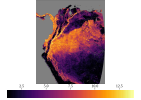

In [25]:
plotMAP(cfparmis, DOY=23)

#### Calculate gpp missings for MSC time-steps

In [26]:
cgppmis = mapCube(doymisFx, c[variable="gross_primary_productivity"], 
    idoy, doyin, indims=indims, outdims=outdims)

Progress: 100%|█████████████████████████████████████████| Time: 0:05:58


YAXArray with the following dimensions
DOY                 Axis with 46 Elements from 1 to 46
lon                 Axis with 2760 Elements from -82.99622135 to -60.00464665
lat                 Axis with 3360 Elements from 13.99613735 to -13.99541735
Total size: 1.59 GB


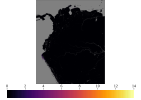

In [27]:
plotMAP(cgppmis, DOY=23)

## Count maximum number of missings along MSC time steps
### A value of 14 means that at least one MSC time-step has not an original retrieval value

In [28]:
cvimismax = mapslices(maximum, cvimis, dims="DOY")

Progress: 100%|█████████████████████████████████████████| Time: 0:00:14


YAXArray with the following dimensions
lon                 Axis with 2760 Elements from -82.99622135 to -60.00464665
lat                 Axis with 3360 Elements from 13.99613735 to -13.99541735
Total size: 35.38 MB


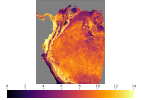

In [29]:
plotMAP(cvimismax)

In [30]:
cfparmismax = mapslices(maximum, cfparmis, dims="DOY")

Progress: 100%|█████████████████████████████████████████| Time: 0:00:11


YAXArray with the following dimensions
lon                 Axis with 2760 Elements from -82.99622135 to -60.00464665
lat                 Axis with 3360 Elements from 13.99613735 to -13.99541735
Total size: 35.38 MB


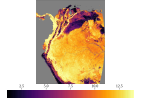

In [31]:
plotMAP(cfparmismax)

In [32]:
cgppmismax = mapslices(maximum, cgppmis, dims="DOY")

Progress: 100%|█████████████████████████████████████████| Time: 0:00:12


YAXArray with the following dimensions
lon                 Axis with 2760 Elements from -82.99622135 to -60.00464665
lat                 Axis with 3360 Elements from 13.99613735 to -13.99541735
Total size: 35.38 MB


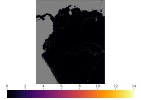

In [33]:
plotMAP(cgppmismax)

## Create a unique mask from the identified maximum missings maps from each variable

In [34]:
vimask = map(x->ismissing(x) ? missing : x==14 ? 0 : 1, cvimismax)

YAXArray with the following dimensions
lon                 Axis with 2760 Elements from -82.99622135 to -60.00464665
lat                 Axis with 3360 Elements from 13.99613735 to -13.99541735
Total size: 70.75 MB


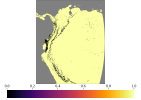

In [35]:
plotMAP(vimask)

In [36]:
fparmask = map(x->ismissing(x) ? missing : x==14 ? 0 : 1, cfparmismax)

YAXArray with the following dimensions
lon                 Axis with 2760 Elements from -82.99622135 to -60.00464665
lat                 Axis with 3360 Elements from 13.99613735 to -13.99541735
Total size: 70.75 MB


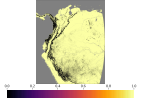

In [37]:
plotMAP(fparmask)

In [38]:
gppmask = map(x->ismissing(x) ? missing : x==14 ? 0 : 1, cgppmismax)

YAXArray with the following dimensions
lon                 Axis with 2760 Elements from -82.99622135 to -60.00464665
lat                 Axis with 3360 Elements from 13.99613735 to -13.99541735
Total size: 70.75 MB


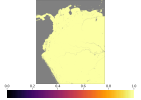

In [39]:
plotMAP(gppmask)

In [40]:
maskall = map((x,y,z)->x.*y.*x, vimask, fparmask, gppmask)

YAXArray with the following dimensions
lon                 Axis with 2760 Elements from -82.99622135 to -60.00464665
lat                 Axis with 3360 Elements from 13.99613735 to -13.99541735
Total size: 70.75 MB


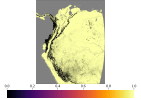

In [41]:
plotMAP(maskall)

## Export data

In [42]:
maskout = map(x->ismissing(x) ? NaN : x, maskall[:,:]');

In [43]:
mask9999 = map(x->ismissing(x) ? 9999 : x, maskall[:,:]');

In [ ]:
writedlm(string(pathout,"msc_missings_mask.csv"), maskout, ",")

In [ ]:
writedlm(string(pathout,"msc_missings_mask9999.csv"), mask9999, ",")